In [1]:
import skimage
import os
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


In [453]:
img_path_list = []
i = 0
while True:
    dummy_path = glob(os.path.join(os.getcwd(),'dataset','Aberdeen','%s.jpg*'%(i)))
    if len(dummy_path) == 0: break
    img_path_list.append(dummy_path[0])
    i += 1
img_path_list

['/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/0.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/1.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/2.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/3.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/4.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/5.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/6.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/7.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/8.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/9.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/10.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/11.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/12.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/13.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/14.jpg',
 '/media/disk3/feynman52/ntu-ml/hw6/dataset/Aberdeen/15.jpg',
 '/media/disk3/fey

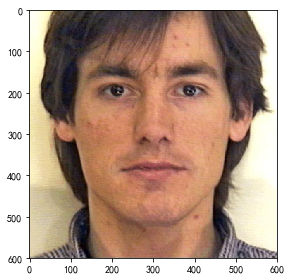

In [457]:
img_path = img_path_list[0]
img = skimage.io.imread(img_path)
img.shape
# img
skimage.io.imshow(img)

In [458]:
img_list = [skimage.io.imread(img_path) for img_path in img_path_list]
img_arr = np.array(img_list)
img_arr.shape

(415, 600, 600, 3)

### 1.請畫出所有臉的平均。

In [459]:
img_mean = np.mean(img_arr,axis=0)
img_mean.shape

(600, 600, 3)

In [460]:
img_mean[0]

array([[230.58072289, 229.6939759 , 224.04578313],
       [232.65542169, 231.72048193, 225.99277108],
       [234.42650602, 233.45060241, 227.69156627],
       ...,
       [190.48433735, 189.74457831, 188.06987952],
       [186.12289157, 185.59036145, 184.2746988 ],
       [  1.19759036,   0.86987952,   0.77831325]])

In [461]:
img_mean.astype(np.uint8)[0]

array([[230, 229, 224],
       [232, 231, 225],
       [234, 233, 227],
       ...,
       [190, 189, 188],
       [186, 185, 184],
       [  1,   0,   0]], dtype=uint8)

/media/disk3/feynman52/.pyenv/versions/3.6.5/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:80: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


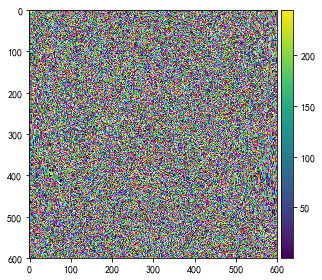

In [462]:
skimage.io.imshow(img_mean.reshape(600, 600, 3))

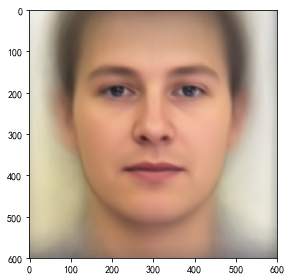

In [463]:
skimage.io.imshow(img_mean.astype(np.uint8).reshape(600, 600, 3))

### 2.請畫出前四個 Eigenfaces，也就是對應到前四大 Eigenvalues 的 Eigenvectors。
https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

In [464]:
img_arr_flatten = img_arr.reshape(img_arr.shape[0],-1)
img_arr_flatten.shape

(415, 1080000)

In [465]:
img_mean_flatten = img_mean.reshape(1,-1)
img_mean_flatten.shape

(1, 1080000)

In [466]:
img_arr_normalize = img_arr_flatten - img_mean_flatten
img_arr_normalize.shape

(415, 1080000)

In [467]:
print(img_arr_flatten[0])
print(img_mean_flatten[0])
print(img_arr_normalize[0])

[255 254 249 ...   1   0   0]
[230.58072289 229.6939759  224.04578313 ...   0.59759036   0.29879518
   1.01204819]
[24.41927711 24.3060241  24.95421687 ...  0.40240964 -0.29879518
 -1.01204819]


In [468]:
U, S, Vh = np.linalg.svd(img_arr_normalize, full_matrices=False)
print(U.shape, S.shape, Vh.shape)

(415, 415) (415,) (415, 1080000)


In [469]:
V = Vh.T
V.shape

(1080000, 415)

(600, 600, 3)


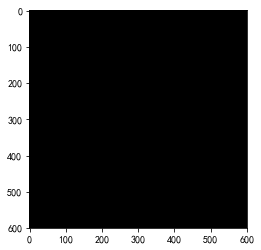

In [470]:
V1 = V[:,0]
V1 = V1.reshape(600, 600, 3).astype(np.uint8)
print(V1.shape)
plt.imshow(V1)


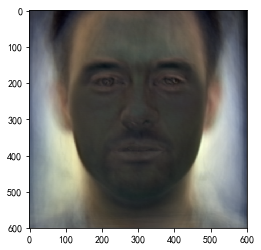

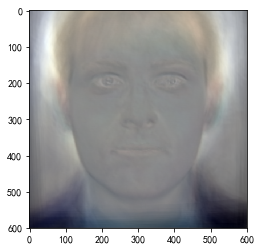

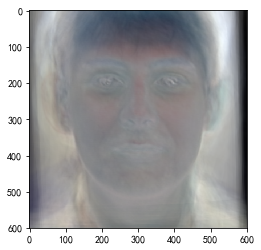

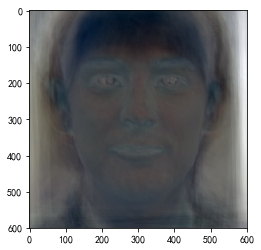

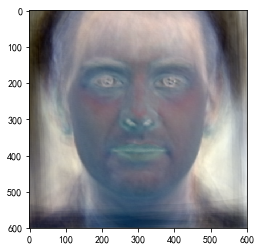

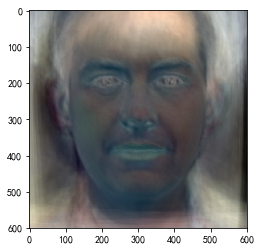

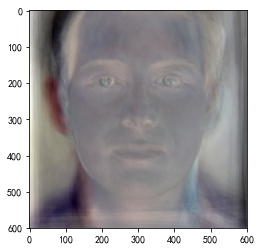

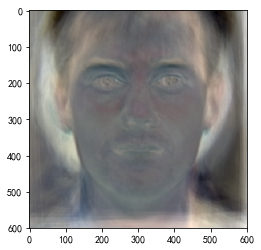

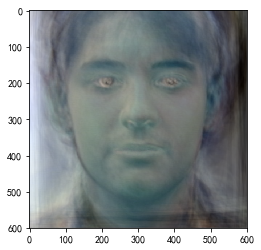

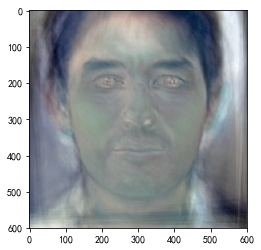

In [471]:
def reconstruct_img(arr):
    arr -= np.min(arr)
    arr /= np.max(arr)
    arr = (arr * 255).astype(np.uint8)
    arr = arr.reshape(600,600,3)
    return arr
    
    
for i in range(10):
    Vi = V[:,i]
    Vi = reconstruct_img(Vi)
    plt.imshow(Vi)
    plt.show()

### 3.請從數據集中挑出任意四個圖片，並用前四大 Eigenfaces 進行 reconstruction，並畫出結果。

https://docs.scipy.org/doc/numpy/reference/generated/numpy.linalg.svd.html

https://stackoverflow.com/questions/11838352/multiply-several-matrices-in-numpy

https://photos.app.goo.gl/DUdoSrbTsd8H813v8

https://photos.app.goo.gl/51QShoH5MJfouEJF8

In [472]:
U, S, Vh = np.linalg.svd(img_arr_normalize, full_matrices=False)
print(U.shape,S.shape,Vh.shape)
img_arr_normalize_recon = U@np.diag(S)@Vh
np.allclose(img_arr_normalize,img_arr_normalize_recon)

(415, 415) (415,) (415, 1080000)


True

In [494]:
def return_img_arr_normalize_rank(rank):
#     rank = 50
    U_rank = U[:,:rank]
    S_rank = S[:rank] 
    S_rank = np.diag(S_rank)
    Vh_rank = Vh[:rank,:]    
    img_arr_normalize_rank = U_rank @ S_rank @ Vh_rank
    return img_arr_normalize_rank
    
rank = 50
U_rank = U[:,:rank]
S_rank = S[:rank] 
S_rank = np.diag(S_rank)
Vh_rank = Vh[:rank,:]
U_rank.shape,S_rank.shape,Vh_rank.shape

((415, 50), (50, 50), (50, 1080000))

In [489]:
img_arr_normalize_rank = U_rank @ S_rank @ Vh_rank # matrix multiply 
img_arr_normalize_rank.shape

(415, 1080000)

https://stackoverflow.com/questions/986006/how-do-i-pass-a-variable-by-reference

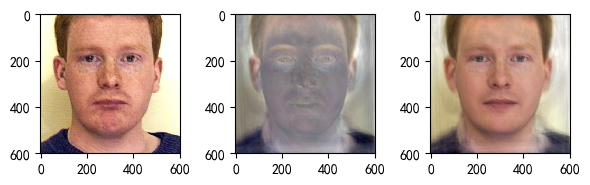

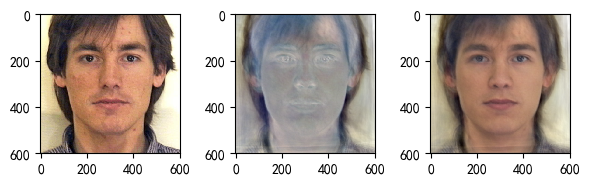

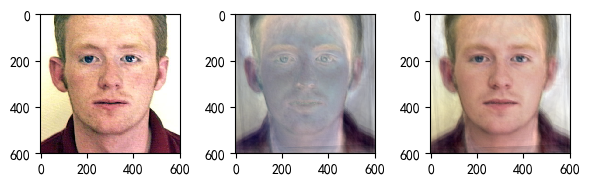

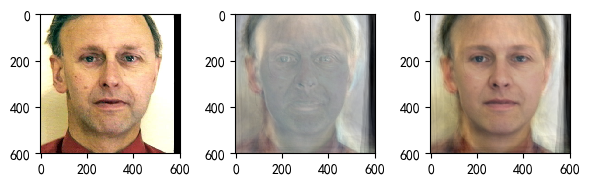

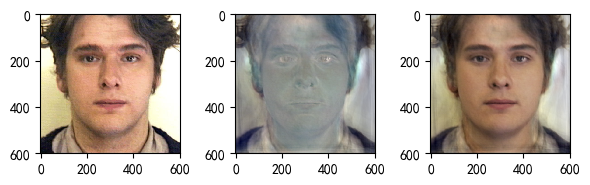

In [490]:
nrow = 1 
ncol = 3
width = 2*ncol
height = 2*nrow

for i in [70,0,45,92,7]:  

    plt.figure(figsize=(width, height),dpi= 100)
    
    plt.subplot(nrow,ncol,1)
    plt.imshow(img_arr[i])
    
    plt.subplot(nrow,ncol,2)
    # if there is no ".copy()", img_arr_normalize_rank will be modified !!!
    img = img_arr_normalize_rank[i].copy() 
    img = reconstruct_img(img)
    plt.imshow(img)
    
    plt.subplot(nrow,ncol,3)
    img = img_arr_normalize_rank[i].copy()
    img += img_mean_flatten.reshape(-1) ####
    img = reconstruct_img(img)
    plt.imshow(img)
    
    plt.tight_layout()
    plt.show() 

In [309]:
# a = np.array([[1,2],[0,0],[-1,-2]])
# U, S, Vh = np.linalg.svd(a, full_matrices=False)
# np.allclose(a,U@np.diag(S)@Vh)

In [498]:
img_index_list = [70,0,45,92,7]
plot_index_list = [1,2,3,4]
list(zip(img_index_list,plot_index_list))

[(70, 1), (0, 2), (45, 3), (92, 4)]

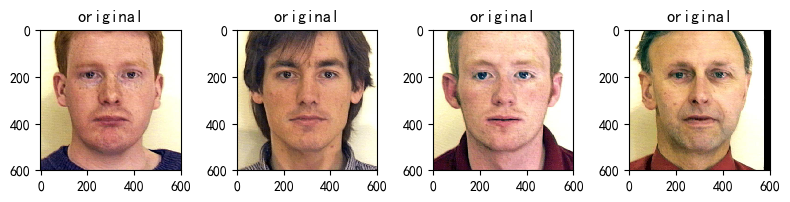

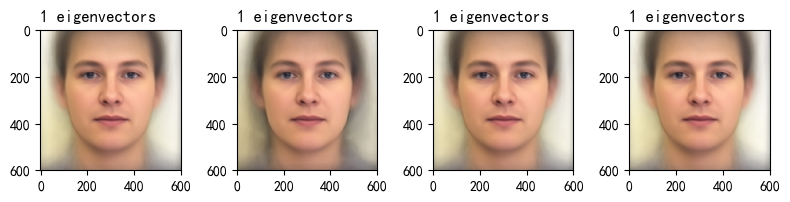

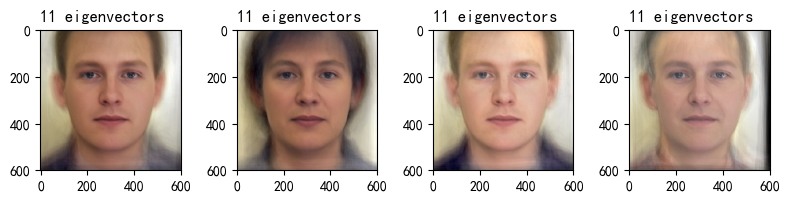

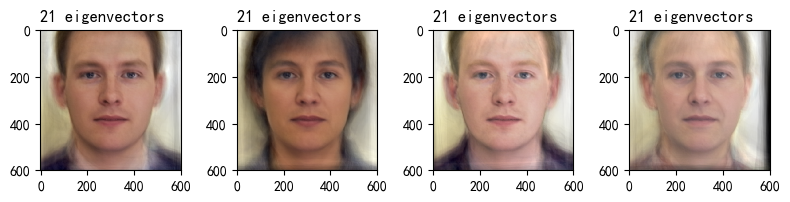

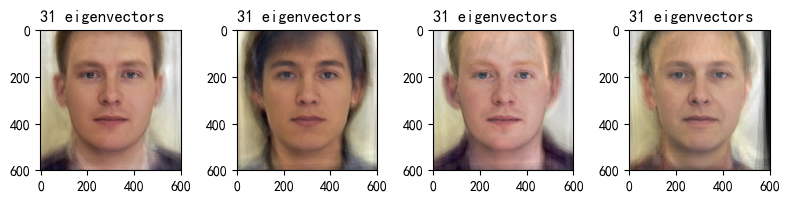

...

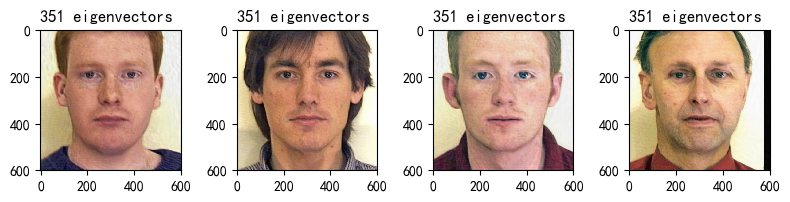

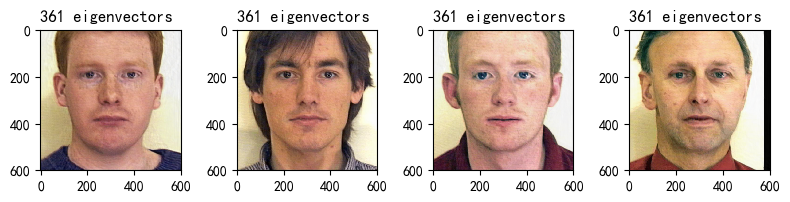

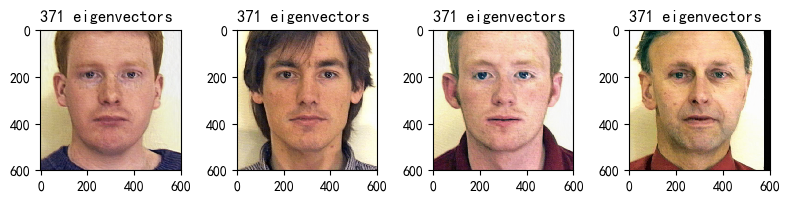

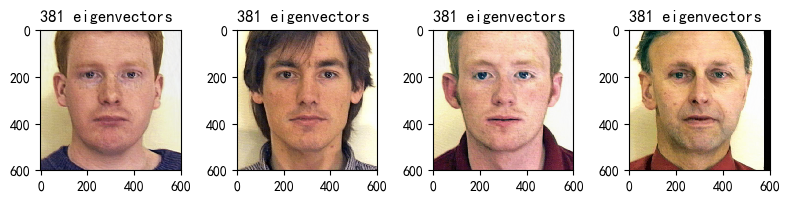

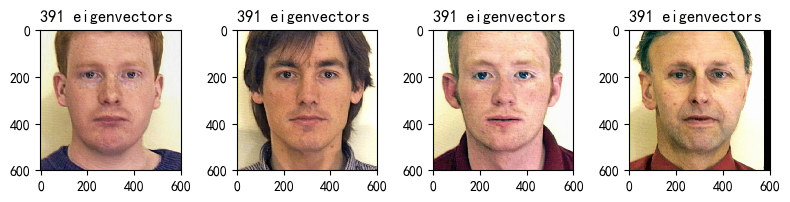

In [508]:
nrow = 1 
ncol = 4
width = 2*ncol
height = 2*nrow

img_index_list = [70,0,45,92,7]
plot_index_list = [1,2,3,4]

# original
plt.figure(figsize=(width, height),dpi= 100)
for img_index,plot_index in zip(img_index_list,plot_index_list):  
        plt.subplot(nrow,ncol,plot_index)
        img = img_arr[img_index]
        plt.imshow(img)     
        plt.title('original',loc='center') 
plt.tight_layout()
plt.show()  


# reconstruct
for rank in range(1,400,10):
    img_arr_normalize_rank = return_img_arr_normalize_rank(rank)
    
    plt.figure(figsize=(width, height),dpi= 100)
      
    for img_index,plot_index in zip(img_index_list,plot_index_list):  
        plt.subplot(nrow,ncol,plot_index)
        img = img_arr_normalize_rank[img_index].copy() 
        img += img_mean_flatten.reshape(-1)
        img = reconstruct_img(img)
        plt.imshow(img)     
        plt.title('%s eigenvectors'%(rank),loc='left') 
    plt.tight_layout()
    plt.show()  

### 4.請寫出前四大 Eigenfaces 各自所佔的比重，也就是 ，請用百分比表示並四捨五入到小數點後一位。

In [515]:
(S / S.sum())[:4]

array([0.04144625, 0.02948732, 0.02387711, 0.02207842])